# 18АС | Пигасин Дмитрий | 4 Вариант

## Подготовка окружения

Установка Keras Tuner

In [1]:
!pip install -U keras-tuner

     |████████████████████████████████| 61kB 5.7MB/s 
  Created wheel for keras-tuner: filename=keras_tuner-1.0.1-cp36-none-any.whl size=73200 sha256=7e2f12f236fbbcd802bf01e671fe3a48905f50f0ef859c01e8a9ec478575a424
  Stored in directory: /root/.cache/pip/wheels/b9/cc/62/52716b70dd90f3db12519233c3a93a5360bc672da1a10ded43
  Created wheel for terminaltables: filename=terminaltables-3.1.0-cp36-none-any.whl size=15356 sha256=df1b26f88ad1a9cd03ef08c1d962f396bcd3285f473050554a2abfce40be9030
  Stored in directory: /root/.cache/pip/wheels/30/6b/50/6c75775b681fb36cdfac7f19799888ef9d8813aff9e379663e
Successfully built keras-tuner terminaltables


Импорт модулей

In [2]:
import os
import random
import numpy as np
import cv2
import keras
import matplotlib.pyplot as plt
from keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, array_to_img
from keras.callbacks import Callback, ModelCheckpoint
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import (Activation, BatchNormalization, Conv2D, Dense,
                                            DepthwiseConv2D, Dropout, GlobalAveragePooling2D)
from kerastuner.tuners import Hyperband
import IPython
import tensorflow as tf
from google.colab.patches import cv2_imshow

Установка переменных окружения

In [3]:
os.environ['LAB2_ROOT'] = '/content/drive/My Drive/data_analysis/lab2'
!mkdir -p "$LAB2_ROOT/images"

Разархивирование наборов данных 

In [ ]:
!unzip -uq "$LAB2_ROOT/train.zip" -d "$LAB2_ROOT/images"
!unzip -uq "$LAB2_ROOT/validation.zip" -d "$LAB2_ROOT/images"
!unzip -uq "$LAB2_ROOT/test.zip" -d "$LAB2_ROOT/images"

Создание генераторов

In [4]:
lab2_root = os.getenv('LAB2_ROOT')
image_path = os.path.join(lab2_root, 'images')

train_dir = os.path.join(image_path, 'train')
validation_dir = os.path.join(image_path, 'validation')
test_dir = os.path.join(image_path, 'test')

img_width = 500
img_height = 500
batch_size = 8

In [ ]:
datagen = ImageDataGenerator(rescale=1./255.)

train_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
)
validation_generator = datagen.flow_from_directory(
    validation_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
)
test_generator = datagen.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
)
train_generator.class_indices

Found 1034 images belonging to 3 classes.
Found 133 images belonging to 3 classes.
Found 128 images belonging to 3 classes.


{'angular_leaf_spot': 0, 'bean_rust': 1, 'healthy': 2}

Визуализация данных

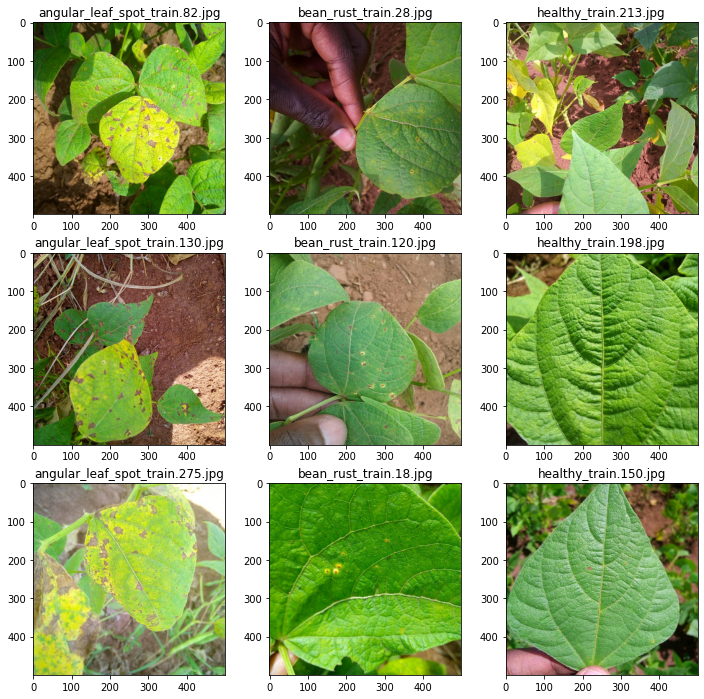

In [5]:
image_dirs = [
              os.path.join(train_dir, 'angular_leaf_spot'),
              os.path.join(train_dir, 'bean_rust'),
              os.path.join(train_dir, 'healthy'),
]

plt.figure(figsize=[12, 12])
for i, path in enumerate([os.path.join(dir, random.choice(os.listdir(dir))) for dir in image_dirs * 3]):
  plt.subplot(3, 3, i+1)
  plt.title(path.split('/')[-1])
  plt.imshow(load_img(path))
plt.show()

## Создание модели

### Поиск оптимальной архитектуры

Функции, описывающие структурные блоки модели

In [ ]:
def add_conv(filters):
  return (
      Conv2D(filters=filters, kernel_size=(1, 1), strides=(1, 1), padding='same'), 
      BatchNormalization(), 
      Activation('relu'),
  )

def add_dw(strides):
  return (
      DepthwiseConv2D(kernel_size=(3, 3), strides=strides, padding='same'),
      BatchNormalization(),
      Activation('relu'),
  )

Описание модели

In [ ]:
def get_my_model(min_filter_count=8, max_filter_count=64, fc_layer_count=1):
  conv_layers=[
          Conv2D(filters=min_filter_count, kernel_size=(3, 3), strides=(2, 2), padding='same', input_shape=(img_width, img_height, 3)),
          BatchNormalization(),
          Activation('relu'),
  ]

  cur_filter_count = min_filter_count * 2
  while cur_filter_count < max_filter_count:
    conv_layers.extend([
                  *add_dw(strides=1),
                  *add_conv(filters=cur_filter_count),
    ])
    cur_filter_count *= 2
    conv_layers.extend([
                  *add_dw(strides=2),
                  *add_conv(filters=cur_filter_count),
    ])

  model = Sequential([
                      *conv_layers,
                      GlobalAveragePooling2D(),
                      *[Dense(max_filter_count // (2 ** i), activation='relu') for i in range(fc_layer_count)],
                      Dense(3),
                      Activation('softmax'),
  ])

  model.compile(
    loss='categorical_crossentropy',
    optimizer='rmsprop',
    metrics=['accuracy'],
  )

  return model

Создание тюнера

In [ ]:
def build_model(hp):
  min_filter_count=hp.Choice('min_filter_count', values=[4, 8, 16, 32, 64])
  max_filter_count=hp.Choice('max_filter_count', values=[32, 64, 128, 256, 512, 1024])
  fc_layer_count=hp.Choice('fc_layer_count', values=[1, 2, 3, 4])
  return get_my_model(min_filter_count, max_filter_count, fc_layer_count)

In [ ]:
tuner = Hyperband(
    build_model,
    objective='val_accuracy', 
    max_epochs=30,
    directory='models',
    project_name='lab2',
)

In [ ]:
tuner.search_space_summary()

Callback для очистки результатов в конце каждого шага обучения

In [ ]:
class ClearTrainingOutput(Callback):
  def on_train_end(*args, **kwargs):
    IPython.display.clear_output(wait = True)

Поиск оптимальных гиперпараметров

In [ ]:
tuner.search(
    train_generator,
    validation_data=validation_generator,
    verbose=2,
    callbacks = [ClearTrainingOutput()],
)

INFO:tensorflow:Oracle triggered exit


Создание модели на основе найденных гиперпараметров

In [ ]:
best_hps = tuner.get_best_hyperparameters()[0]
model = tuner.hypermodel.build(best_hps)
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 250, 250, 8)       224       
_________________________________________________________________
batch_normalization (BatchNo (None, 250, 250, 8)       32        
_________________________________________________________________
activation (Activation)      (None, 250, 250, 8)       0         
_________________________________________________________________
depthwise_conv2d (DepthwiseC (None, 250, 250, 8)       80        
_________________________________________________________________
batch_normalization_1 (Batch (None, 250, 250, 8)       32        
_________________________________________________________________
activation_1 (Activation)    (None, 250, 250, 8)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 250, 250, 16)      1

### Обучение модели

In [ ]:
checkpoint = ModelCheckpoint(
    os.path.join(lab2_root, 'best_epoch.h5'),
    save_best_only=True,
    monitor='val_accuracy',
    mode='max',
    verbose=2,
)

In [ ]:
fit_history = model.fit(
    train_generator,
    epochs=100,
    validation_data=validation_generator,
    verbose=2,
    callbacks=[checkpoint],
)

Epoch 1/100

Epoch 00001: val_accuracy improved from -inf to 0.33835, saving model to /content/drive/My Drive/data_analysis/lab2/best_model.h5
130/130 - 14s - loss: 0.8408 - accuracy: 0.6044 - val_loss: 1.1543 - val_accuracy: 0.3383
Epoch 2/100

Epoch 00002: val_accuracy did not improve from 0.33835
130/130 - 14s - loss: 0.7142 - accuracy: 0.6934 - val_loss: 1.1745 - val_accuracy: 0.3383
Epoch 3/100

Epoch 00003: val_accuracy did not improve from 0.33835
130/130 - 14s - loss: 0.7210 - accuracy: 0.6896 - val_loss: 1.5460 - val_accuracy: 0.3233
Epoch 4/100

Epoch 00004: val_accuracy improved from 0.33835 to 0.70677, saving model to /content/drive/My Drive/data_analysis/lab2/best_model.h5
130/130 - 14s - loss: 0.6587 - accuracy: 0.7186 - val_loss: 0.6315 - val_accuracy: 0.7068
Epoch 5/100

Epoch 00005: val_accuracy did not improve from 0.70677
130/130 - 14s - loss: 0.6575 - accuracy: 0.7282 - val_loss: 0.8848 - val_accuracy: 0.5338
Epoch 6/100

Epoch 00006: val_accuracy did not improve fr

## Оценка результатов

### Построение графиков

In [ ]:
def draw_graphics(fit_history):
    history = fit_history.history
    loss = history['loss']
    val_loss = history["val_loss"]
    accuracy = history['accuracy']
    val_accuracy = history['val_accuracy']
    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'r', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()

    plt.plot(epochs, accuracy, 'r', label='Training accuracy')
    plt.plot(epochs, val_accuracy, 'b', label='Validation accuracy')
    plt.title('Training and validation accuracy')
    plt.xlabel('epochs')
    plt.ylabel('accuracy')
    plt.legend()
    plt.show()

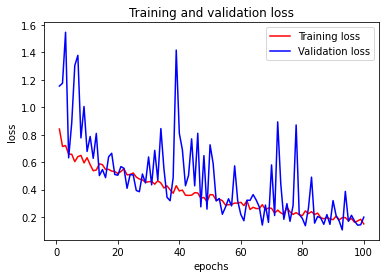

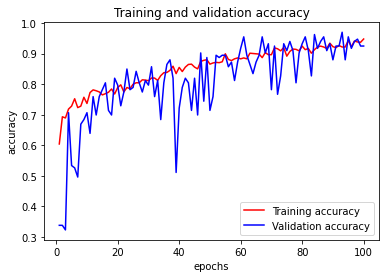

In [ ]:
draw_graphics(fit_history)

### Предсказания

100 эпох

In [ ]:
loss, accuracy = model.evaluate(test_generator)

16/16 [==============================] - 1s 93ms/step - loss: 0.2237 - accuracy: 0.9141


In [ ]:
model.save(f'/content/drive/My Drive/data_analysis/lab2/models/model_{accuracy:.2f}_accuracy.h5')

Эпоха с лучшим val_accuracy

In [ ]:
best_epoch = keras.models.load_model('/content/drive/My Drive/data_analysis/lab2/best_epoch.h5')

In [ ]:
loss, accuracy = best_epoch.evaluate(test_generator)

16/16 [==============================] - 1s 77ms/step - loss: 0.3018 - accuracy: 0.8906


In [6]:
model = keras.models.load_model('/content/drive/My Drive/data_analysis/lab2/models/model_0.91_accuracy.h5')

Функция предобработки изображения на вход сети

In [7]:
def preprocess_image(image):
  return np.expand_dims(img_to_array(image), axis=0) / 255.

Результаты предсказаний

In [ ]:
image_paths = [os.path.join(dir, random.choice(os.listdir(dir))) for dir in image_dirs * 3]
classes = ['angular_leaf_spot', 'bean_rust', 'healthy']

for path in image_paths:
  out = model.predict(preprocess_image(load_img(path)))[0]
  print(dict(zip(classes,[round(x, 2) for x in out])), path.split('/')[-1])

{'angular_leaf_spot': 0.98, 'bean_rust': 0.02, 'healthy': 0.0} angular_leaf_spot_train.259.jpg
{'angular_leaf_spot': 0.01, 'bean_rust': 0.99, 'healthy': 0.0} bean_rust_train.80.jpg
{'angular_leaf_spot': 0.0, 'bean_rust': 0.03, 'healthy': 0.97} healthy_train.41.jpg
{'angular_leaf_spot': 0.99, 'bean_rust': 0.0, 'healthy': 0.01} angular_leaf_spot_train.17.jpg
{'angular_leaf_spot': 0.0, 'bean_rust': 1.0, 'healthy': 0.0} bean_rust_train.41.jpg
{'angular_leaf_spot': 0.0, 'bean_rust': 0.0, 'healthy': 1.0} healthy_train.231.jpg
{'angular_leaf_spot': 0.82, 'bean_rust': 0.18, 'healthy': 0.0} angular_leaf_spot_train.214.jpg
{'angular_leaf_spot': 0.0, 'bean_rust': 1.0, 'healthy': 0.0} bean_rust_train.75.jpg
{'angular_leaf_spot': 0.0, 'bean_rust': 0.0, 'healthy': 1.0} healthy_train.230.jpg


### Тестирование с шумом

In [202]:
S = 1

def get_normal_noise(image):
  noise = np.random.normal(128, 20, (image.shape[0], image.shape[1]))
  return np.dstack((noise, noise, noise)).astype(np.uint8)

def add_normal_noise(image):
  noise = get_normal_noise(image) * S
  noise_image = cv2.add(image.astype(np.float64), noise.astype(np.float64))
  cv2.normalize(noise_image, noise_image, 0, 255, cv2.NORM_MINMAX)
  return noise_image

def get_uniform_noise(image):
  noise = np.random.uniform(0, 255, (image.shape[0], image.shape[1]))
  return np.dstack((noise, noise, noise)).astype(np.uint8)

def add_uniform_noise(image):
  noise = get_uniform_noise(image) * S
  noise_image = cv2.add(image.astype(np.float64), noise.astype(np.float64))
  cv2.normalize(noise_image, noise_image, 0, 255, cv2.NORM_MINMAX)
  return noise_image

test_generator_with_normal_noise = ImageDataGenerator(rescale=1./255, preprocessing_function=add_normal_noise).flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
)

test_generator_with_uniform_noise = ImageDataGenerator(rescale=1./255, preprocessing_function=add_uniform_noise).flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
)

Found 128 images belonging to 3 classes.
Found 128 images belonging to 3 classes.


### Изображения + нормальный шум

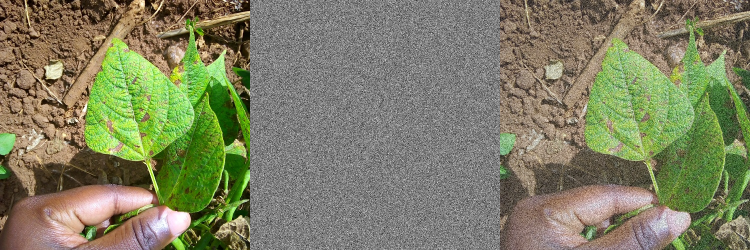

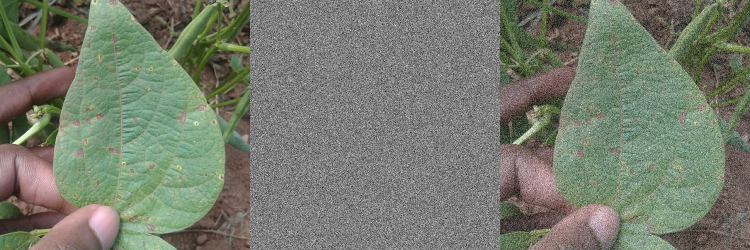

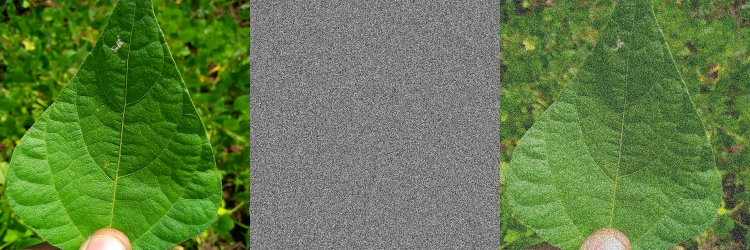

In [203]:
for i, path in zip(list(range(0, 9, 3)),[os.path.join(dir, random.choice(os.listdir(dir))) for dir in image_dirs]):
  image = cv2.resize(cv2.imread(path), (250, 250))
  cv2_imshow(np.concatenate((image, get_normal_noise(image), add_normal_noise(image)), axis=1))

In [204]:
loss, accuracy = model.evaluate(test_generator_with_normal_noise)

16/16 [==============================] - 3s 204ms/step - loss: 1.1743 - accuracy: 0.5703


### Изображения + равномерный шум

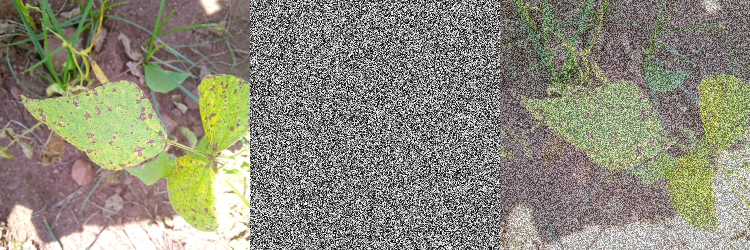

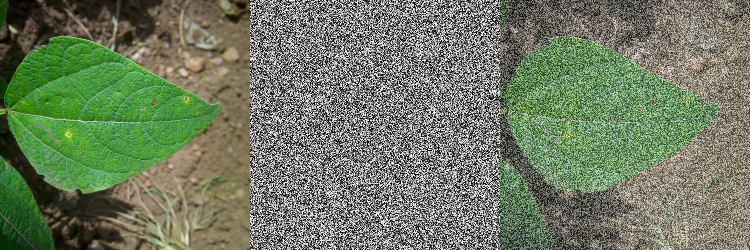

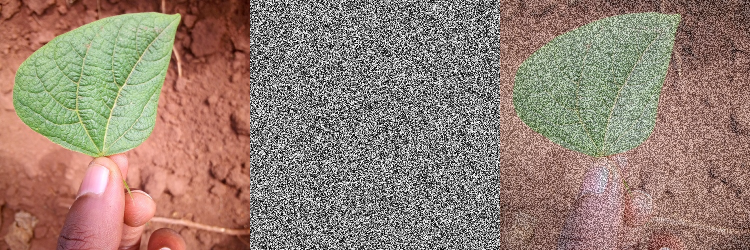

In [205]:
for i, path in zip(list(range(0, 9, 3)),[os.path.join(dir, random.choice(os.listdir(dir))) for dir in image_dirs]):
  image = cv2.resize(cv2.imread(path), (250, 250))
  cv2_imshow(np.concatenate((image, get_uniform_noise(image), add_uniform_noise(image)), axis=1))

In [206]:
loss, accuracy = model.evaluate(test_generator_with_uniform_noise)

16/16 [==============================] - 2s 148ms/step - loss: 2.5685 - accuracy: 0.4844


## Ядра свертки и карты признаков

In [ ]:
def draw_layer_filters(layer_index):
  filters, biases = model.layers[layer_index].get_weights()
  print(filters.shape)

  filter_list = [filters[:, :, j, i] for i, j in zip(sorted(list(range(filters.shape[-1])) * filters.shape[-2]), list(range(filters.shape[-2])) * filters.shape[-1])]
  rows = filters.shape[-1] if filters.shape[-1] != 1 else 8
  cols = filters.shape[-2] if filters.shape[-1] != 1 else filters.shape[-2] // 8

  plt.figure(figsize=[10, 10])
  for i in range(len(filter_list)):
    plt.subplot(rows, cols, i+1, xticks=([]), yticks=([]))
    plt.imshow(filter_list[i], cmap='gray')
  plt.show()

Фильтры входного слоя

(3, 3, 3, 8)


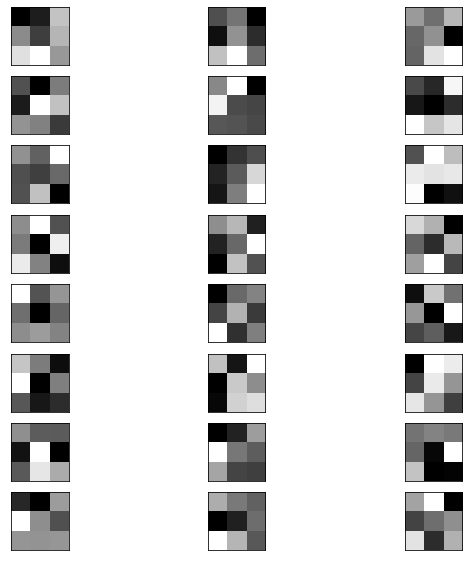

In [ ]:
draw_layer_filters(0)

Фильтры последнего сверточного слоя

(3, 3, 32, 1)


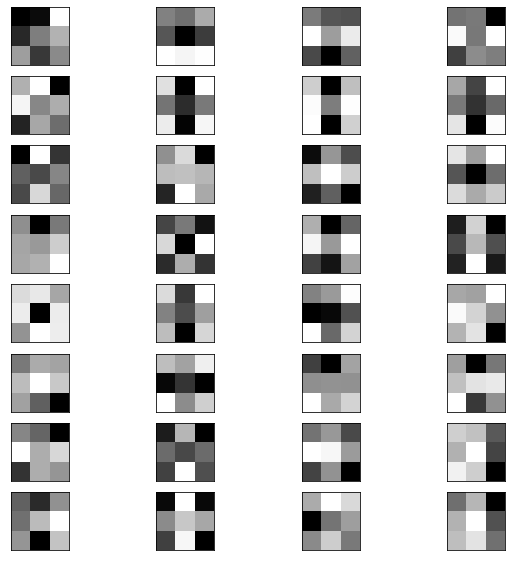

In [ ]:
draw_layer_filters(21)

In [ ]:
def get_feature_maps(original_model, image_tensor, layer_index):
  model = keras.models.Model(inputs=original_model.inputs, outputs=original_model.layers[layer_index].output)
  print(original_model.layers[layer_index].name)
  return model.predict(image_tensor)

In [ ]:
def draw_feature_maps(feature_maps):
  plt.figure(figsize=[64, 64])
  for i, feature_map in enumerate([feature_maps[0, :, :, j] for j in range(feature_maps.shape[-1])]):
    plt.subplot(8, 8, i+1, xticks=([]), yticks=([]))
    plt.imshow(feature_map, cmap='gray')
  plt.show()

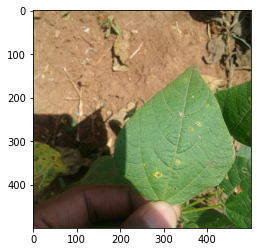

In [ ]:
# image_path = '/content/drive/My Drive/data_analysis/lab2/images/train/angular_leaf_spot/angular_leaf_spot_train.1.jpg'
image_path = '/content/drive/My Drive/data_analysis/lab2/images/train/bean_rust/bean_rust_train.5.jpg'
# image_path = '/content/drive/My Drive/data_analysis/lab2/images/train/healthy/healthy_train.1.jpg'

image = load_img(image_path)
image_tensor = preprocess_image(image)
plt.imshow(image)

In [ ]:
blocks = []
for i, layer in enumerate(model.layers):
  if 'conv' in layer.name and not '_conv' in layer.name:
      blocks.append(i + 2)

print(blocks)

[2, 8, 14, 20, 26]


Карты признаков после каждого структурного элемента (блока) сети

activation


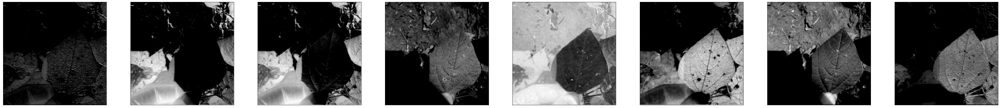

activation_2


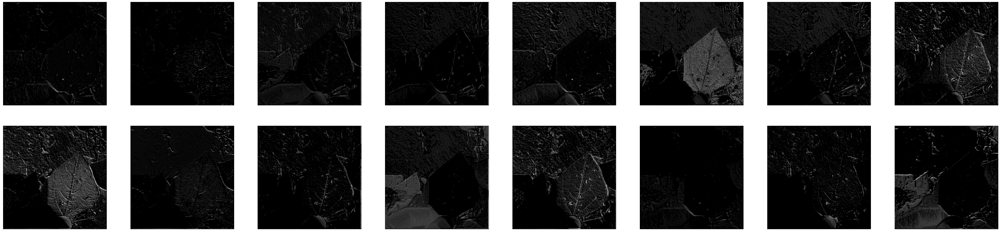

activation_4


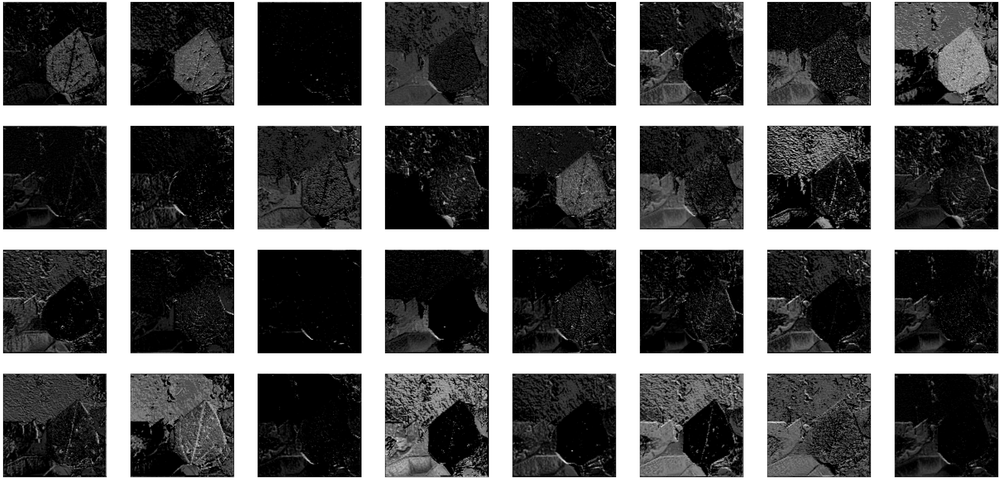

activation_6


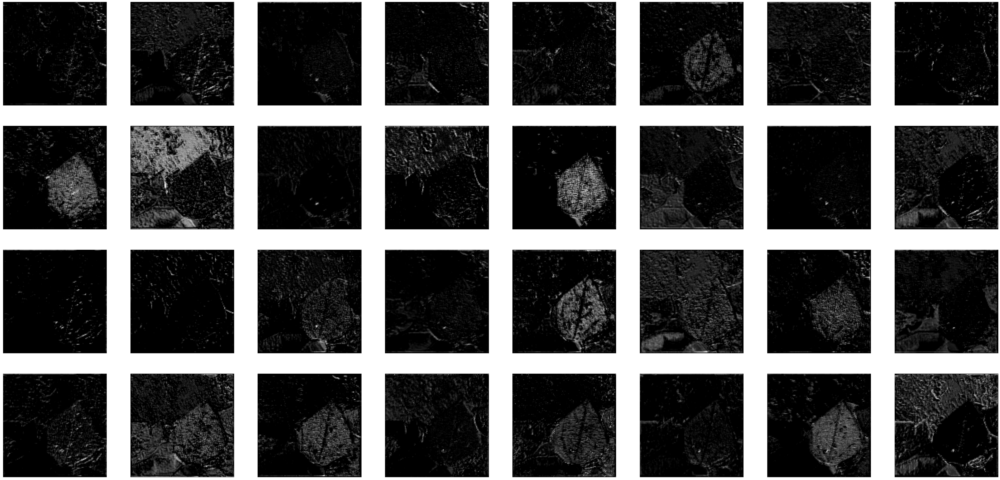

activation_8


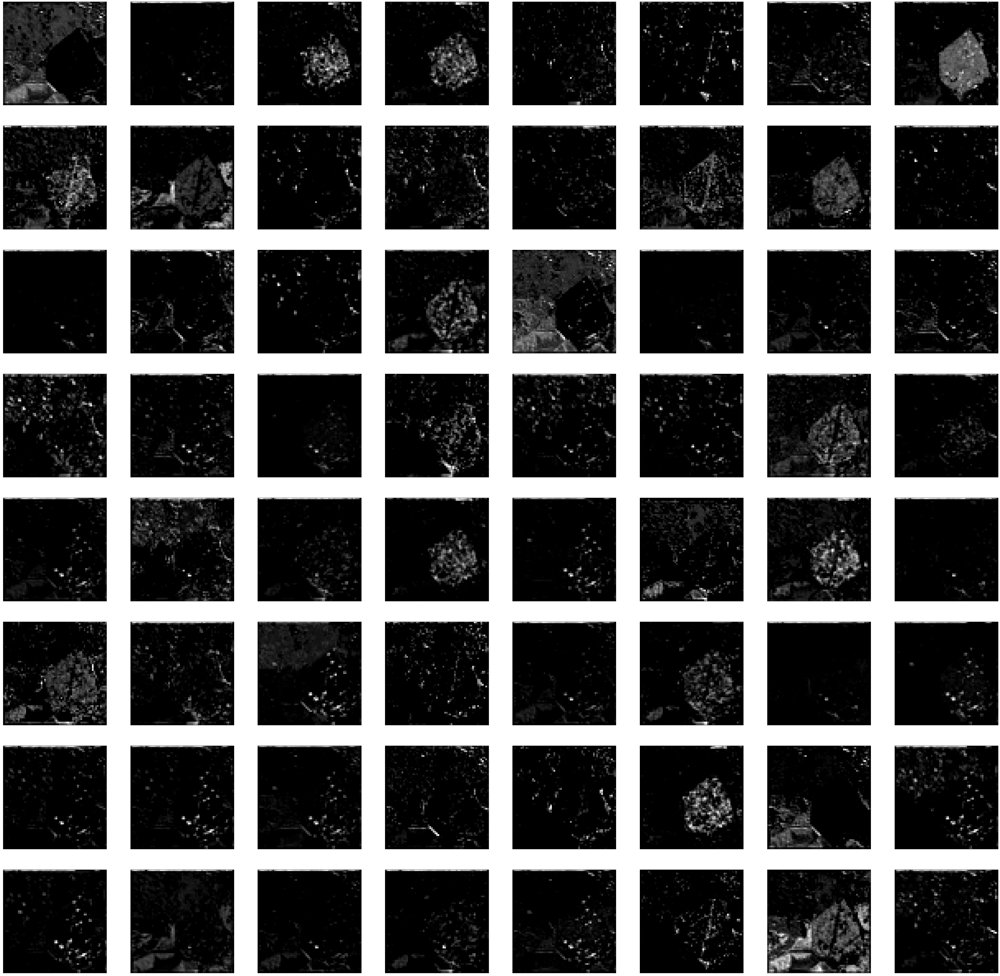

In [ ]:
for i in blocks:
  feature_maps = get_feature_maps(model, image_tensor, i)
  draw_feature_maps(feature_maps)